In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from scipy import stats
import plotly.express as px
import bar_chart_race as bcr

In [2]:
data = pd.read_csv(r"C:\Users\shahe\Desktop\Innomatics Task\dataset.csv")

In [3]:
data.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [4]:
data.shape

(112634, 17)

In [5]:
data.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,112634.000000,112634.000000,112634.000000,112634.000000,112348.000000,1.126340e+05,1.126340e+05
mean,98156.226850,2019.003365,87.812987,1793.439681,29.805604,1.994567e+08,5.296650e+10
std,2648.733064,2.892364,102.334216,10783.753486,14.700545,9.398427e+07,1.699104e+09
min,1730.000000,1997.000000,0.000000,0.000000,1.000000,4.777000e+03,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,18.000000,1.484142e+08,5.303301e+10
50%,98119.000000,2020.000000,32.000000,0.000000,34.000000,1.923896e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191899e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.603300e+10


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [8]:
# checking missing values
print("Missing Value Count:")
print(data.isna().sum().sort_values())

Missing Value Count:
VIN (1-10)                                             0
DOL Vehicle ID                                         0
Base MSRP                                              0
Electric Range                                         0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Make                                                   0
Electric Vehicle Type                                  0
Postal Code                                            0
State                                                  0
City                                                   0
County                                                 0
Model Year                                             0
2020 Census Tract                                      0
Model                                                 20
Vehicle Location                                      24
Legislative District                                 286
Electric Utility                                     443
dtype: int

In [10]:
# Remove missing Values
data.dropna(inplace=True)
data.reset_index(drop=True, inplace=True)
print("Missing Values Count:")
print(data.isna().sum().sort_values())

Missing Values Count:
VIN (1-10)                                           0
Vehicle Location                                     0
DOL Vehicle ID                                       0
Legislative District                                 0
Base MSRP                                            0
Electric Range                                       0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Utility                                     0
Electric Vehicle Type                                0
Make                                                 0
Model Year                                           0
Postal Code                                          0
State                                                0
City                                                 0
County                                               0
Model                                                0
2020 Census Tract                                    0
dtype: int64


In [11]:
data.shape

(112152, 17)

In [12]:
# Count the number of unique value in each columns
count={}
for col in data.columns:
    count[col]=data[col].nunique()
for idx, element in count.items():
    print(f"{idx}: {element}")

VIN (1-10): 7522
County: 39
City: 435
State: 1
Postal Code: 516
Model Year: 20
Make: 34
Model: 114
Electric Vehicle Type: 2
Clean Alternative Fuel Vehicle (CAFV) Eligibility: 3
Electric Range: 101
Base MSRP: 30
Legislative District: 49
DOL Vehicle ID: 112152
Vehicle Location: 516
Electric Utility: 73
2020 Census Tract: 1760


In [13]:
numerical_columns = data.select_dtypes(include=['number']).columns
print(numerical_columns)

Index(['Postal Code', 'Model Year', 'Electric Range', 'Base MSRP',
       'Legislative District', 'DOL Vehicle ID', '2020 Census Tract'],
      dtype='object')


In [14]:
categorical_columns = data.select_dtypes(exclude=['number']).columns
print(categorical_columns)

Index(['VIN (1-10)', 'County', 'City', 'State', 'Make', 'Model',
       'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Vehicle Location',
       'Electric Utility'],
      dtype='object')


## Univariate Analysis

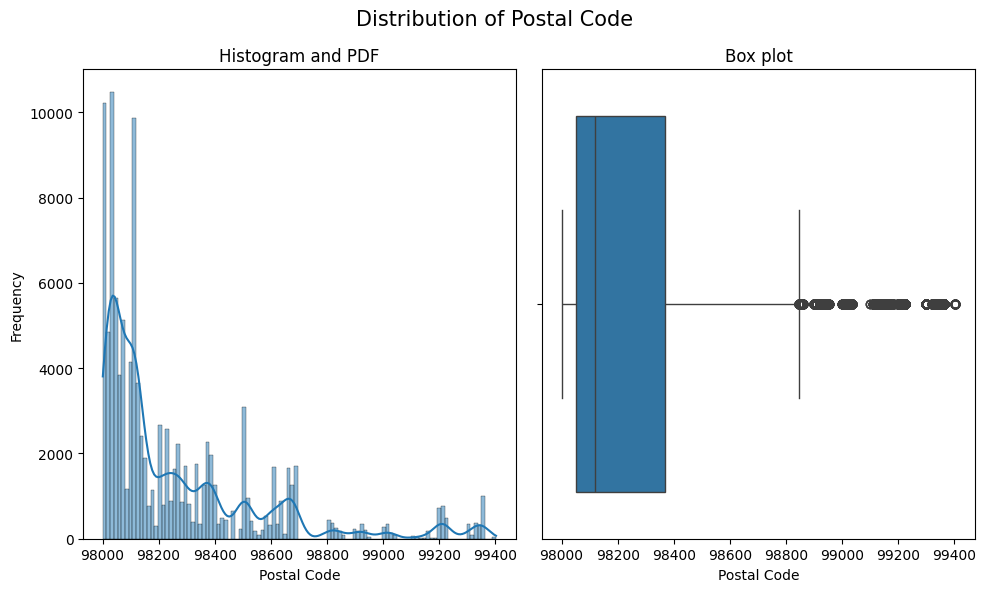

Observation for Postal Code:
The distribution appears to be skewed.
The mean value is 98258.86 and the median is 98121.00.
The data ranges from 98001.00 to 99403.00.
Skewness: 1.83
Kurtosis: 3.13
The interquartile range (IQR) is 318.00
There are 6514 outliers identified.




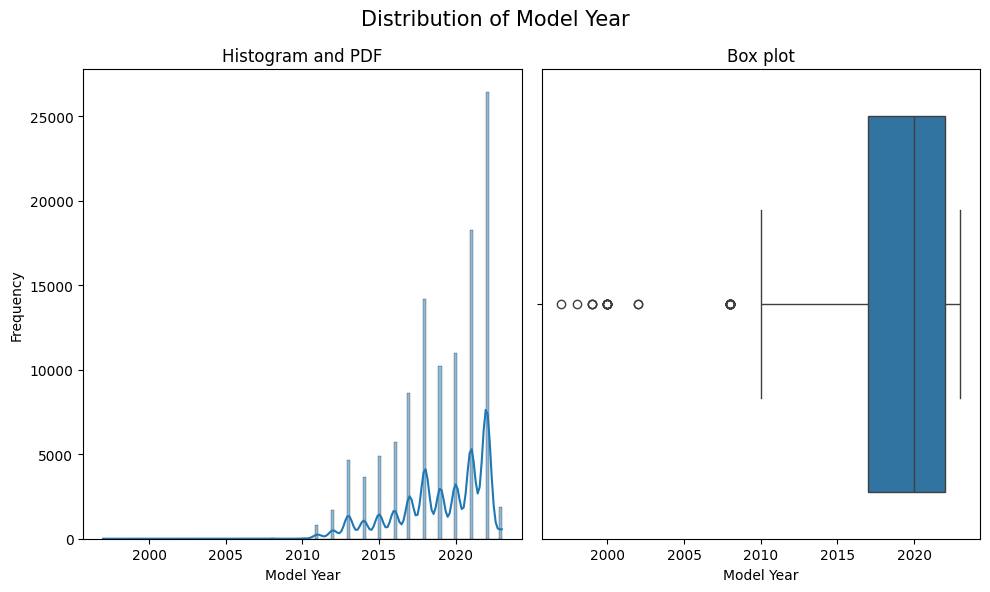

Observation for Model Year:
The distribution appears to be skewed.
The mean value is 2019.00 and the median is 2020.00.
The data ranges from 1997.00 to 2023.00.
Skewness: -0.82
Kurtosis: 0.00
The interquartile range (IQR) is 5.00
There are 40 outliers identified.




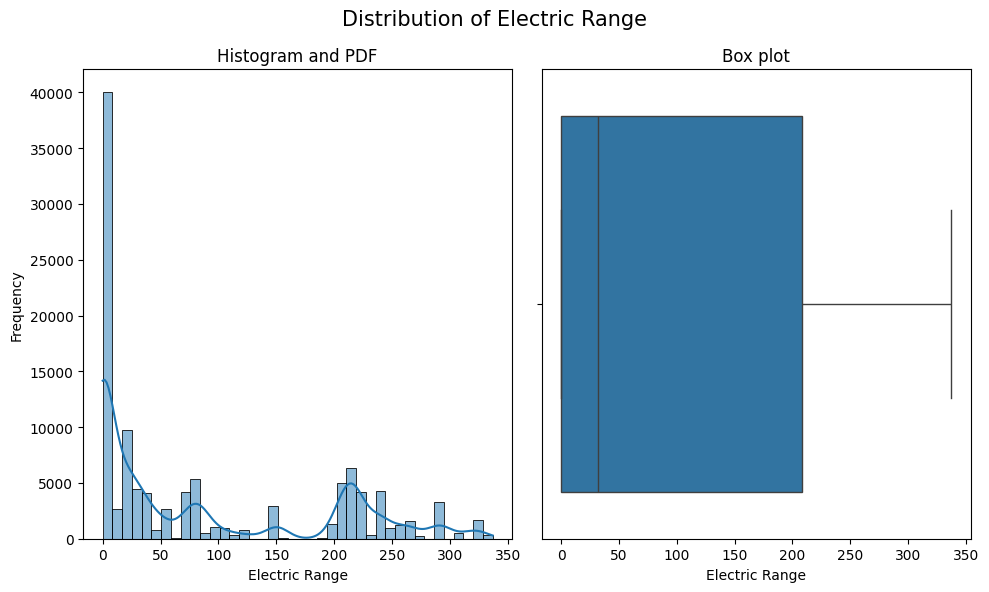

Observation for Electric Range:
The distribution appears to be skewed.
The mean value is 87.83 and the median is 32.00.
The data ranges from 0.00 to 337.00.
Skewness: 0.82
Kurtosis: -0.88
The interquartile range (IQR) is 208.00
There are 0 outliers identified.




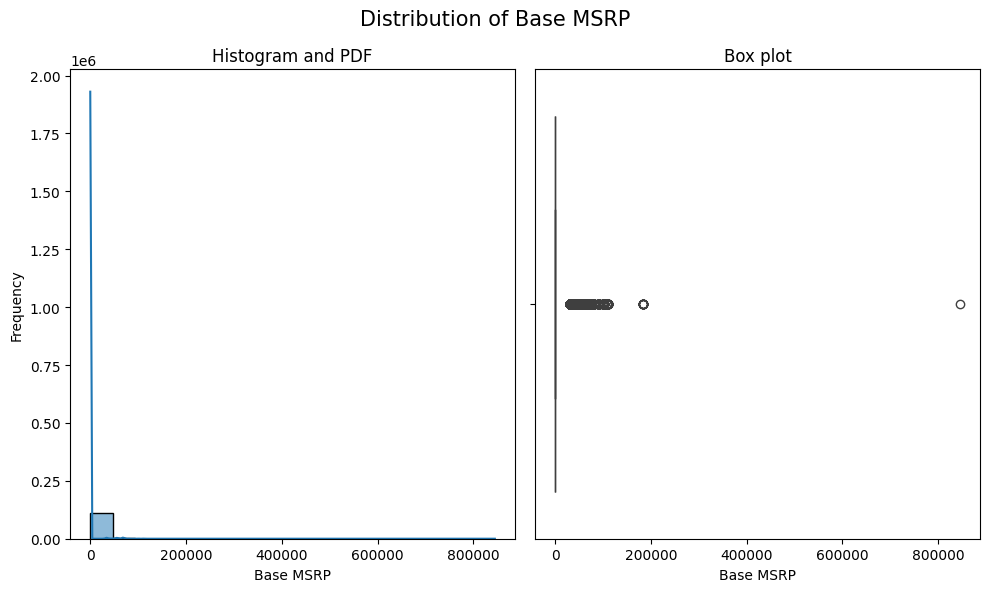

Observation for Base MSRP:
The distribution appears to be skewed.
The mean value is 1793.88 and the median is 0.00.
The data ranges from 0.00 to 845000.00.
Skewness: 10.11
Kurtosis: 372.91
The interquartile range (IQR) is 0.00
There are 3498 outliers identified.




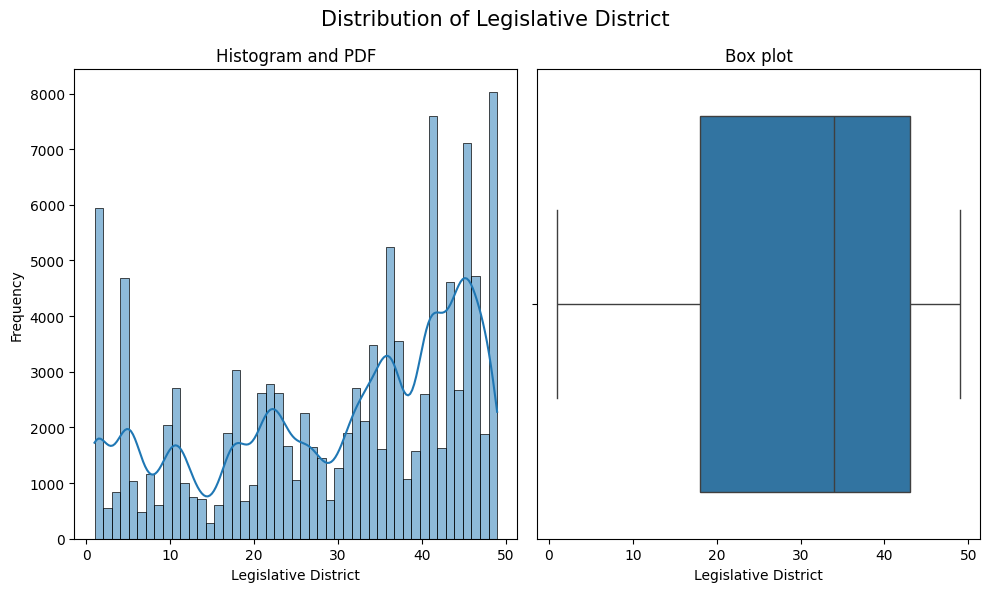

Observation for Legislative District:
The distribution appears to be skewed.
The mean value is 29.82 and the median is 34.00.
The data ranges from 1.00 to 49.00.
Skewness: -0.54
Kurtosis: -0.98
The interquartile range (IQR) is 25.00
There are 0 outliers identified.




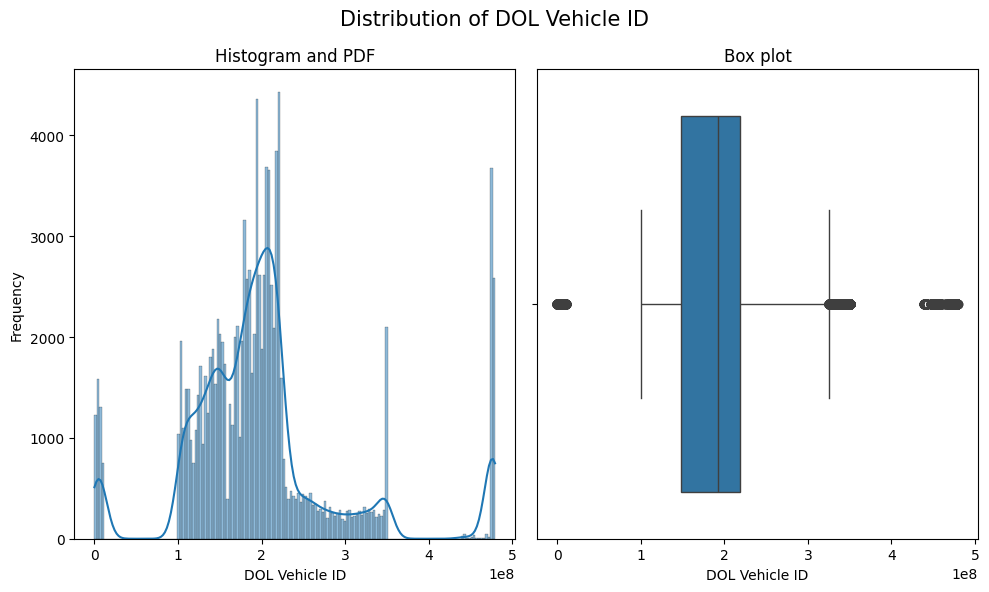

Observation for DOL Vehicle ID:
The distribution appears to be skewed.
The mean value is 199471226.93 and the median is 192391604.50.
The data ranges from 4777.00 to 479254772.00.
Skewness: 1.15
Kurtosis: 2.46
The interquartile range (IQR) is 70772079.00
There are 15483 outliers identified.




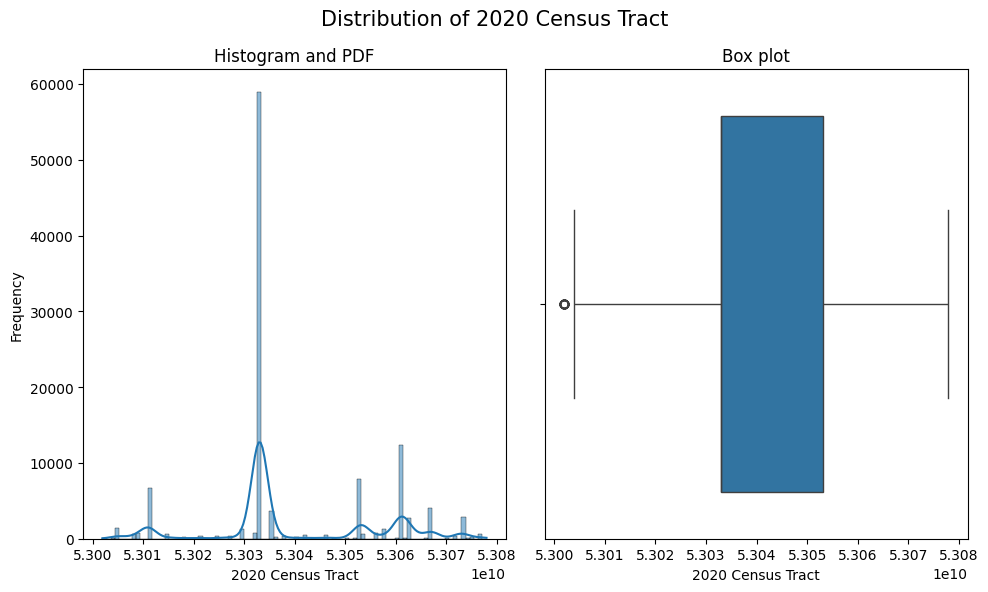

Observation for 2020 Census Tract:
The distribution appears to be symetric.
The mean value is 53039581729.10 and the median is 53033029307.00.
The data ranges from 53001950100.00 to 53077940007.00.
Skewness: 0.31
Kurtosis: -0.39
The interquartile range (IQR) is 20063806.00
There are 34 outliers identified.




In [17]:
def plot_hist_and_box(df, columns):
    for col in columns:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 6))
        fig.suptitle(f'Distribution of {col}', fontsize = 15)
        sns.histplot(df[col], kde = True, ax = ax1)
        ax1.set_title('Histogram and PDF')
        ax1.set_xlabel(col)
        ax1.set_ylabel('Frequency')
        sns.boxplot(x = df[col], ax = ax2)
        ax2.set_title('Box plot')
        ax2.set_xlabel(col)
        plt.tight_layout()
        plt.show()
        print(f"Observation for {col}:")
        print(f"The distribution appears to be {'symetric' if abs(df[col].skew())< 0.5 else 'skewed'}.")
        print(f"The mean value is {df[col].mean():.2f} and the median is {df[col].median():.2f}.")
        print(f"The data ranges from {df[col].min():.2f} to {df[col].max():.2f}.")
        print(f"Skewness: {df[col].skew():.2f}")
        print(f"Kurtosis: {df[col].kurtosis():.2f}")
        q1, q3 = df[col].quantile([0.25, 0.75])
        iqr = q3 -q1
        lower_bound = q1 - (1.5 * iqr)
        upper_bound = q3 + (1.5 * iqr)
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        print(f"The interquartile range (IQR) is {iqr:.2f}")
        print(f"There are {len(outliers)} outliers identified.")
        print("\n")

plot_hist_and_box(data, numerical_columns)

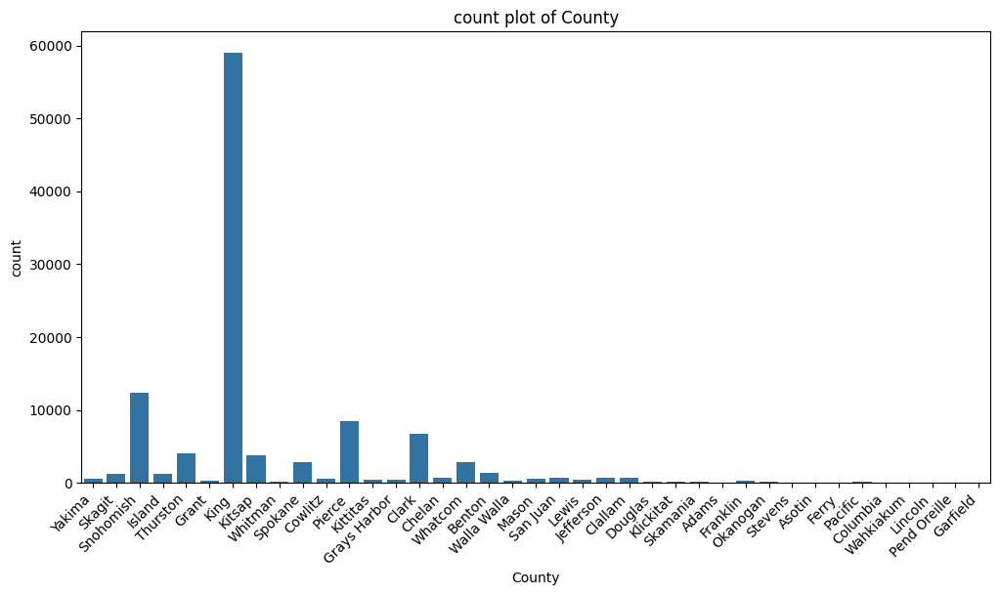

Observation for County count plot:
The most frequent category is 'King' with 58980 occurrences.
The least frequent category is 'Garfield' with 4 occurrences.
There are 39 unique categories.




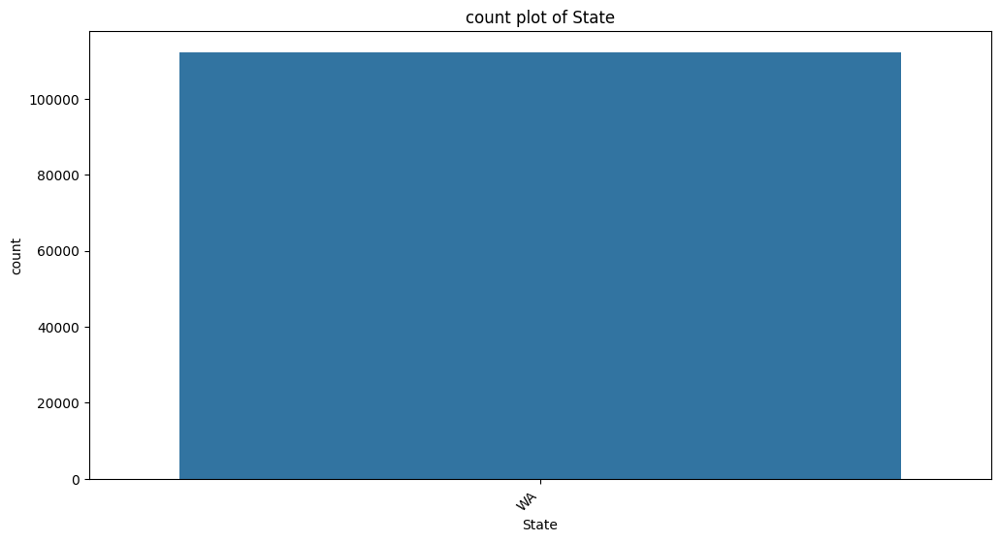

Observation for State count plot:
The most frequent category is 'WA' with 112152 occurrences.
The least frequent category is 'WA' with 112152 occurrences.
There are 1 unique categories.




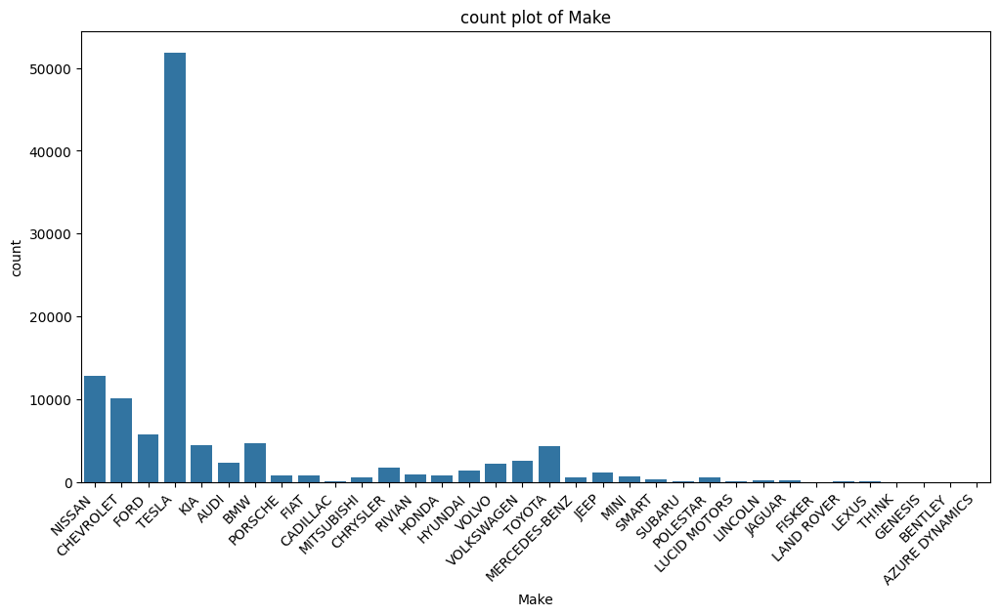

Observation for Make count plot:
The most frequent category is 'TESLA' with 51883 occurrences.
The least frequent category is 'BENTLEY' with 3 occurrences.
There are 34 unique categories.




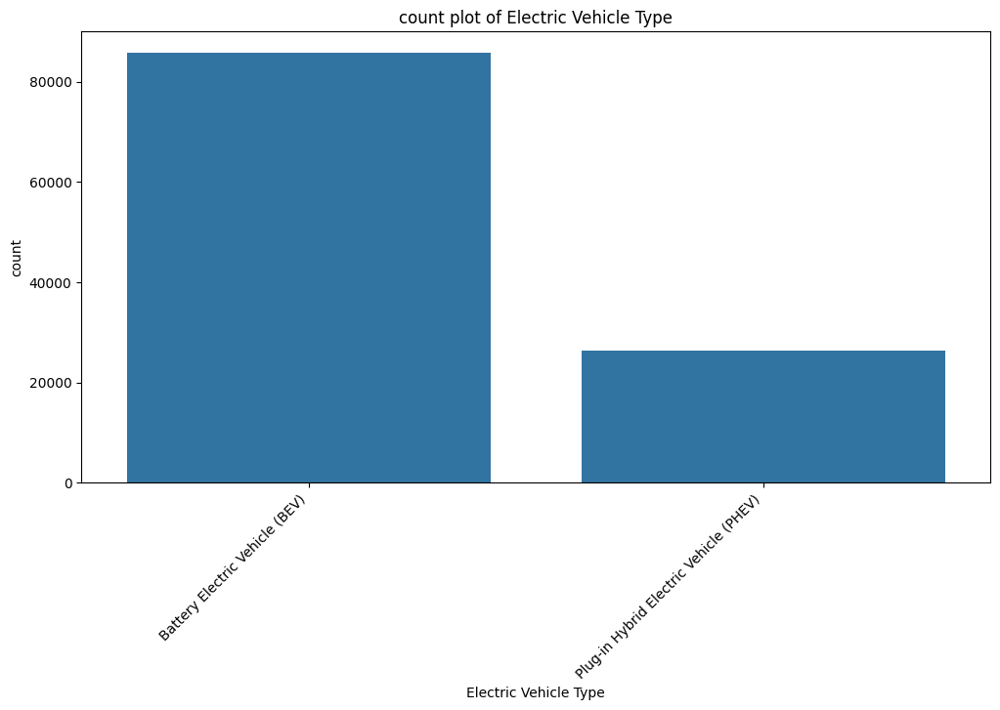

Observation for Electric Vehicle Type count plot:
The most frequent category is 'Battery Electric Vehicle (BEV)' with 85732 occurrences.
The least frequent category is 'Plug-in Hybrid Electric Vehicle (PHEV)' with 26420 occurrences.
There are 2 unique categories.




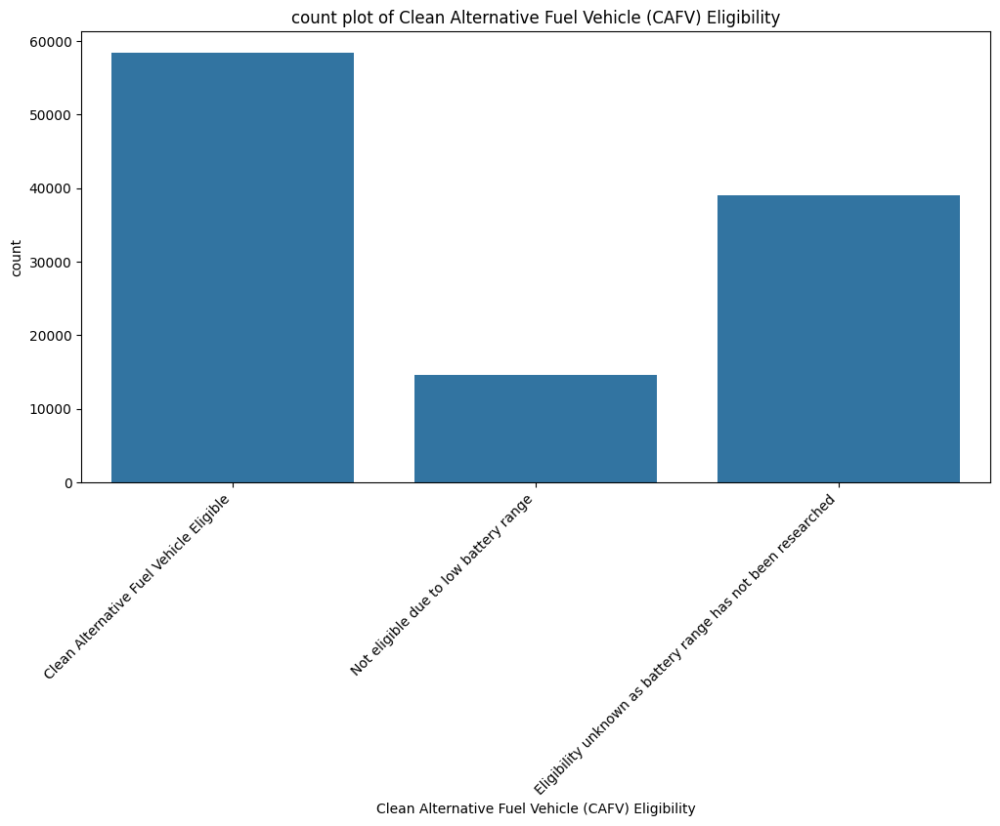

Observation for Clean Alternative Fuel Vehicle (CAFV) Eligibility count plot:
The most frequent category is 'Clean Alternative Fuel Vehicle Eligible' with 58395 occurrences.
The least frequent category is 'Not eligible due to low battery range' with 14660 occurrences.
There are 3 unique categories.




In [18]:
def plot_countplots(df, columns):
    for col in columns:
        if data[col].nunique()<=50:
            plt.figure(figsize=(12, 6))
            sns.countplot(x = col, data = df)
            plt.title(f'count plot of {col}')
            plt.xticks(rotation = 45, ha = 'right')
            plt.show()
            print(f"Observation for {col} count plot:")
            value_counts = df[col].value_counts()
            print(f"The most frequent category is '{value_counts.index[0]}' with {value_counts.iloc[0]} occurrences.")
            print(f"The least frequent category is '{value_counts.index[-1]}' with {value_counts.iloc[-1]} occurrences.")
            print(f"There are {df[col].nunique()} unique categories.")
            print("\n")
plot_countplots(data, categorical_columns)

## Observation

Market Dominance: Tesla has nearly half of vehicles in the dataset.

Vehicle Type: Battery Electric Vehicles (BEVs) are more common than plug-in Hybrid Electric Vehicles (PHEVs).

Electric Range: Electric ranges vary widely, from 0 to 337 miles.

Price variation: Base MSRP shows extreme variation, with some high-priced vehicles skewing the data.

Model Years: The dataset includes vehicles from 1997 to 2023, mainly focusing on newer models.

Location: King country has the highest number of vehicles.

In [20]:
for col in numerical_columns:
    q1 = data[col].quantile(0.25)
    q3 = data[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    print(f"\nOutliers in {col}:")
    print(outliers[col])
    print(f"Number of outliers: {len(outliers)}")
    print(f"Percentage of outliers: {(len(outliers) / len(data )) * 100:.2f}%")
    print("\n")


Outliers in Postal Code:
0         98901
26        98901
35        98902
36        98908
37        99163
          ...  
111976    98930
111981    99207
112011    99212
112035    99354
112119    99218
Name: Postal Code, Length: 6514, dtype: int64
Number of outliers: 6514
Percentage of outliers: 5.81%



Outliers in Model Year:
14060     2008
14794     2000
23460     2008
23629     2000
28440     1997
30255     2008
39606     1999
39620     2008
43518     2008
48018     2000
49706     1999
50799     2000
50929     2000
51402     2008
51683     2008
52074     2008
53289     2008
53872     2008
55461     2008
62222     2008
64504     2008
65837     2008
66740     2008
66993     1998
72401     2008
74264     2008
74678     2008
77775     2008
79796     2000
81413     2008
82524     2008
84068     2000
84699     2000
86384     2000
88710     2008
92415     2002
94728     2000
99261     2002
109840    1999
111757    2008
Name: Model Year, dtype: int64
Number of outliers: 40
Percentage of ou

## Bivariate Analysis

In [25]:
def plot_scatter(df, x_col, y_col):
    fig, ax = plt.subplots(figsize = (12, 8))
    fig.suptitle(f'Relationship between {x_col} and {y_col}', fontsize = 16)
    sns.scatterplot(data = df, x = x_col, y = y_col, ax = ax)
    ax.set_title('Scatter Plot')
    plt.tight_layout()
    plt.show()
    correlation = df[x_col].corr(df[y_col])
    print(f"Observation for {x_col} vs {y_col}:")
    print(f"The correlation coefficient is {correlation:.2f}")
    print(f"There appears to be a {'positive' if correlation > 0 else 'negative'} {'strong' if abs(correlation) > 0.5 else 'weak'} relationship.")
    print("\n")

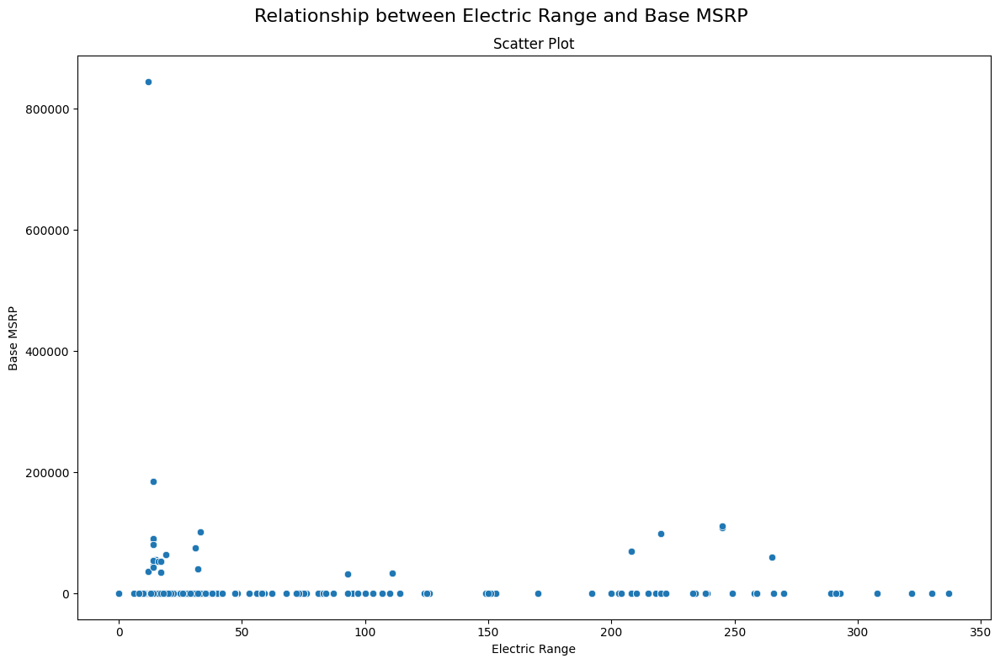

Observation for Electric Range vs Base MSRP:
The correlation coefficient is 0.09
There appears to be a positive weak relationship.




In [26]:
plot_scatter(data,'Electric Range','Base MSRP')

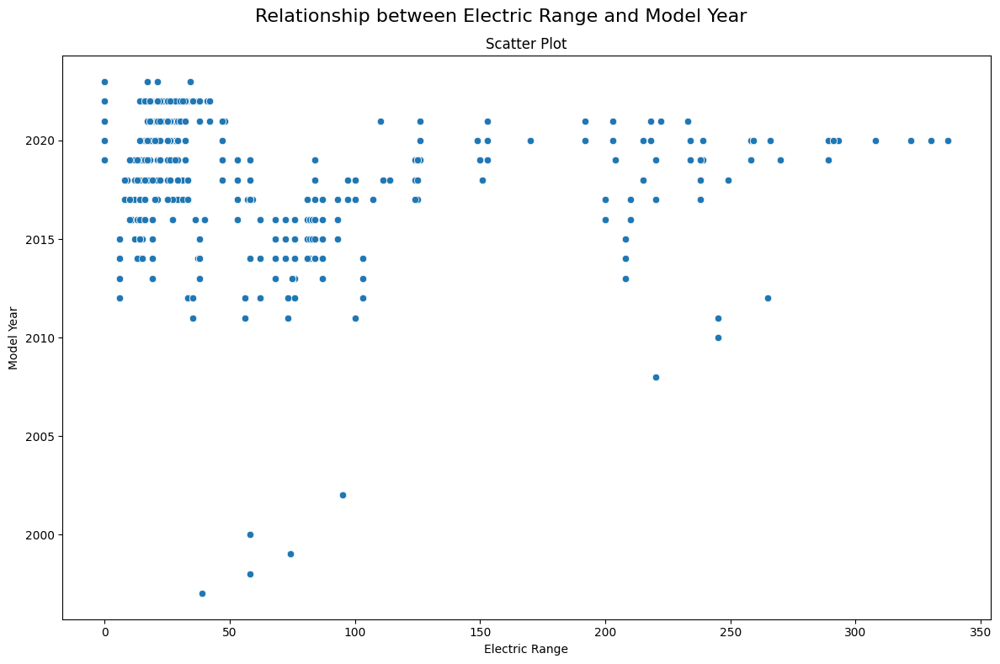

Observation for Electric Range vs Model Year:
The correlation coefficient is -0.29
There appears to be a negative weak relationship.




In [27]:
plot_scatter(data,'Electric Range','Model Year')

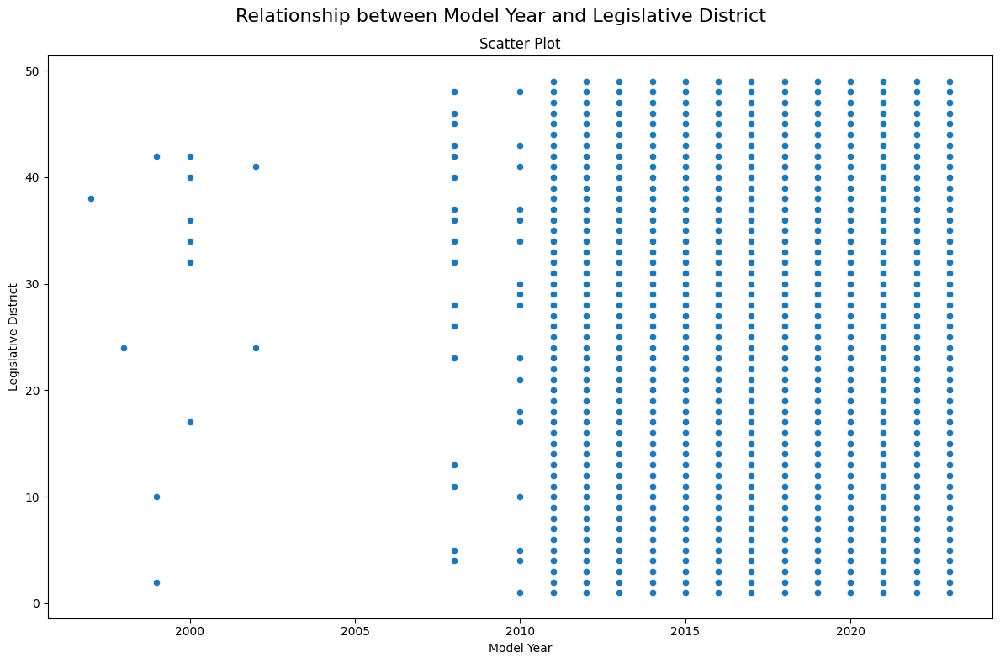

Observation for Model Year vs Legislative District:
The correlation coefficient is 0.01
There appears to be a positive weak relationship.




In [71]:
def plot_scatter(df, x_col, y_col):
    fig, ax = plt.subplots(figsize = (12, 8))
    fig.suptitle(f'Relationship between {x_col} and {y_col}', fontsize = 16)
    sns.scatterplot(data = df, x = x_col, y = y_col, ax = ax)
    ax.set_title('Scatter Plot')
    plt.tight_layout()
    plt.show()
    correlation = df[x_col].corr(df[y_col])
    print(f"Observation for {x_col} vs {y_col}:")
    print(f"The correlation coefficient is {correlation:.2f}")
    print(f"There appears to be a {'positive' if correlation > 0 else 'negative'} {'strong' if abs(correlation) > 0.5 else 'weak'} relationship.")
    print("\n")



plot_scatter(data,'Model Year','Legislative District')

In [29]:
print(data.columns)

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')


In [42]:
cat_col1 = 'Make'
cat_col2 = 'Electric Vehicle Type'
def plot_stacked_bar(df, cat_col1, cat_col2):
    contingency_table = pd.crosstab(df[cat_col1], df[cat_col2], normalize = 'index')
    contingency_table .plot(kind = 'bar', stacked = True, figsize = (12, 6))
    plt.title(f'Stacked Bar plot of {cat_col1} vs {cat_col2}')
    plt.xlabel(cat_col1)
    plt.ylabel('Proportion')
    plt.legend(title = cat_col2, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plt.tight_layout()
    plt.show()
    
print(f"Observation for stacked bar plot of {cat_col1} vs {cat_col2}:")
print(f"Each bar represents the proportion pf categories in {cat_col1} vs {cat_col2} for each category in {cat_col1}.")
print("The full height of each bar is 100%.")
print("\n")




Observation for stacked bar plot of Make vs Electric Vehicle Type:
Each bar represents the proportion pf categories in Make vs Electric Vehicle Type for each category in Make.
The full height of each bar is 100%.




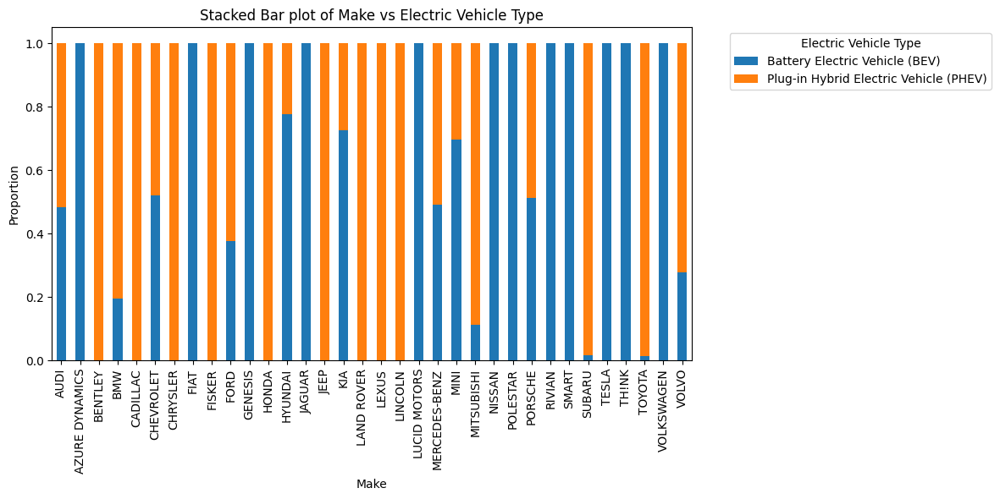

In [41]:
plot_stacked_bar(data, 'Make','Electric Vehicle Type')

In [44]:
cat_col1 = 'County'
cat_col2 = 'Electric Vehicle Type'
def plot_stacked_bar(df, cat_col1, cat_col2):
    contingency_table = pd.crosstab(df[cat_col1], df[cat_col2], normalize = 'index')
    contingency_table .plot(kind = 'bar', stacked = True, figsize = (12, 6))
    plt.title(f'Stacked Bar plot of {cat_col1} vs {cat_col2}')
    plt.xlabel(cat_col1)
    plt.ylabel('Proportion')
    plt.legend(title = cat_col2, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plt.tight_layout()
    plt.show()
    
print(f"Observation for stacked bar plot of {cat_col1} vs {cat_col2}:")
print(f"Each bar represents the proportion pf categories in {cat_col1} vs {cat_col2} for each category in {cat_col1}.")
print("The full height of each bar is 100%.")
print("\n")


Observation for stacked bar plot of County vs Electric Vehicle Type:
Each bar represents the proportion pf categories in County vs Electric Vehicle Type for each category in County.
The full height of each bar is 100%.




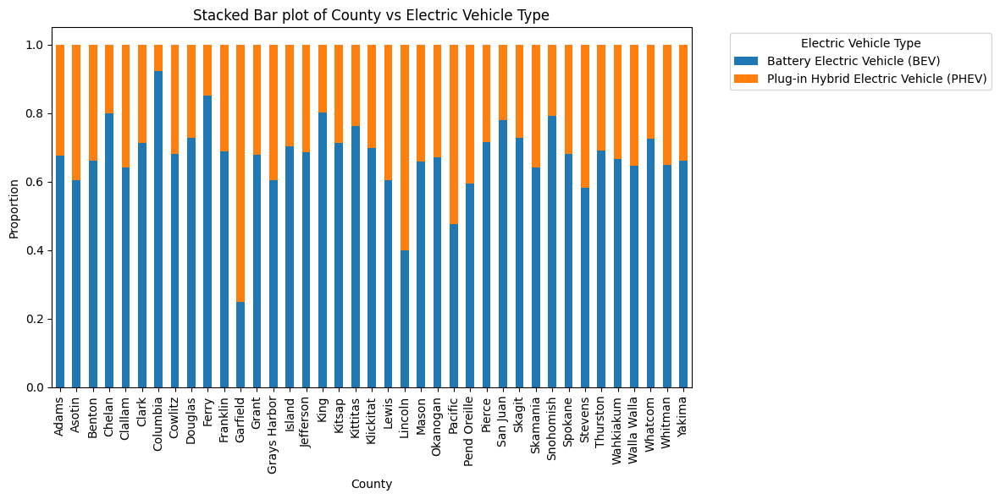

In [43]:
plot_stacked_bar(data, 'County','Electric Vehicle Type')

In [45]:
cat_col1 = 'County'
cat_col2 = 'Make'
def plot_stacked_bar(df, cat_col1, cat_col2):
    contingency_table = pd.crosstab(df[cat_col1], df[cat_col2], normalize = 'index')
    contingency_table .plot(kind = 'bar', stacked = True, figsize = (12, 6))
    plt.title(f'Stacked Bar plot of {cat_col1} vs {cat_col2}')
    plt.xlabel(cat_col1)
    plt.ylabel('Proportion')
    plt.legend(title = cat_col2, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plt.tight_layout()
    plt.show()
    
print(f"Observation for stacked bar plot of {cat_col1} vs {cat_col2}:")
print(f"Each bar represents the proportion pf categories in {cat_col1} vs {cat_col2} for each category in {cat_col1}.")
print("The full height of each bar is 100%.")
print("\n")


Observation for stacked bar plot of County vs Make:
Each bar represents the proportion pf categories in County vs Make for each category in County.
The full height of each bar is 100%.




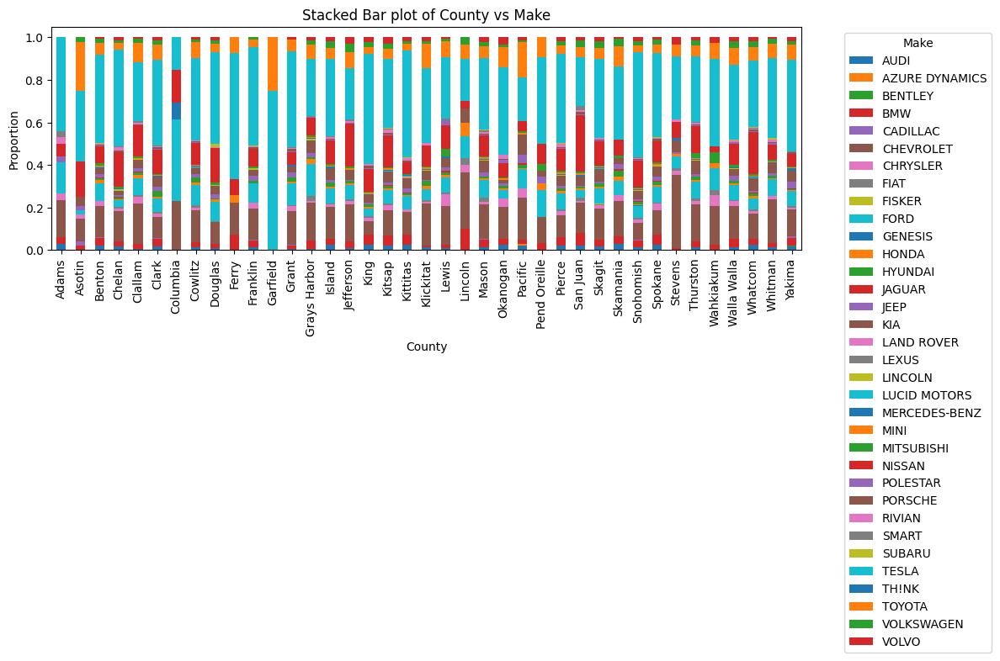

In [46]:
plot_stacked_bar(data, 'County','Make')

Observation for Make vs Electric Range:
Box Plot: Shows median, quartiles, and potential outliers.




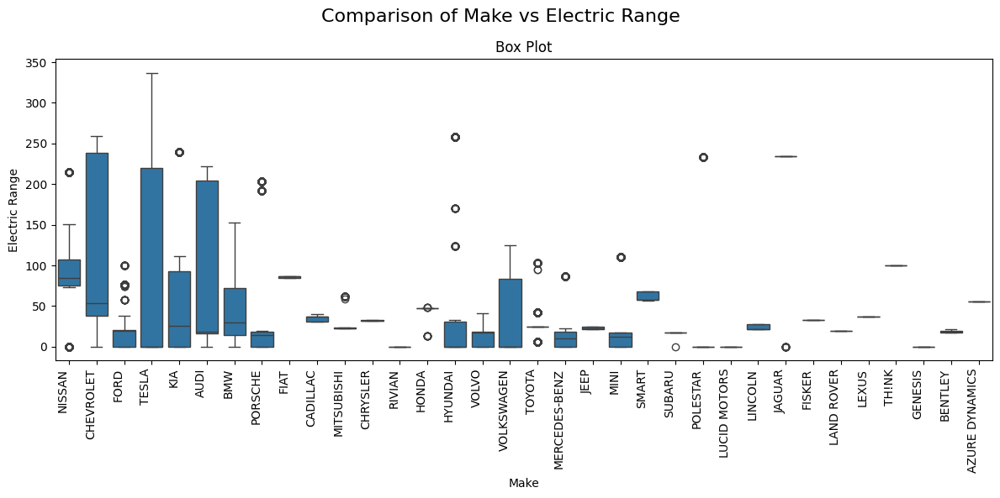

In [53]:
cat_col = 'Make'
num_col = 'Electric Range'

def plot_cat_num(df, cat_col, num_col):
    fig, ax = plt.subplots(figsize = (12, 6))
    fig.suptitle(f'Comparison of {cat_col} vs {num_col}', fontsize = 16)
    
    sns.boxplot(data = df, x = cat_col, y = num_col, ax = ax)
    ax.set_title('Box Plot')

    ax.set_xticks(range(len(df[cat_col].unique())))
    ax.set_xticklabels(df[cat_col].unique(), rotation = 90, ha = 'right')
    
    plt.tight_layout()
    plt.show()
    
print(f"Observation for {cat_col} vs {num_col}:")
print("Box Plot: Shows median, quartiles, and potential outliers.")
print("\n")


plot_cat_num(data, 'Make','Electric Range')

Observation for Make vs Base MSRP:
Box Plot: Shows median, quartiles, and potential outliers.




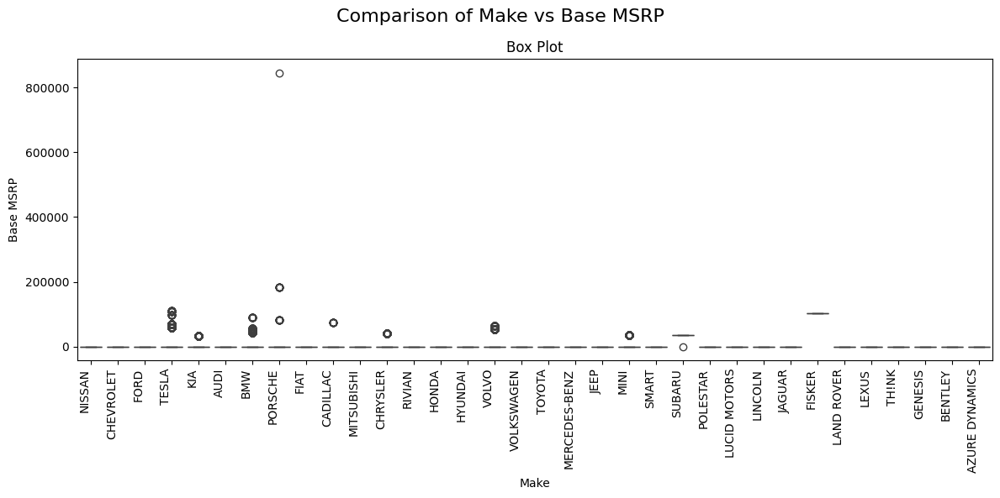

In [55]:
cat_col = 'Make'
num_col = 'Base MSRP'

def plot_cat_num(df, cat_col, num_col):
    fig, ax = plt.subplots(figsize = (12, 6))
    fig.suptitle(f'Comparison of {cat_col} vs {num_col}', fontsize = 16)
    
    sns.boxplot(data = df, x = cat_col, y = num_col, ax = ax)
    ax.set_title('Box Plot')

    ax.set_xticks(range(len(df[cat_col].unique())))
    ax.set_xticklabels(df[cat_col].unique(), rotation = 90, ha = 'right')
    
    plt.tight_layout()
    plt.show()
    
print(f"Observation for {cat_col} vs {num_col}:")
print("Box Plot: Shows median, quartiles, and potential outliers.")
print("\n")


plot_cat_num(data, 'Make','Base MSRP')

Observation for Make vs Legislative District:
Box Plot: Shows median, quartiles, and potential outliers.




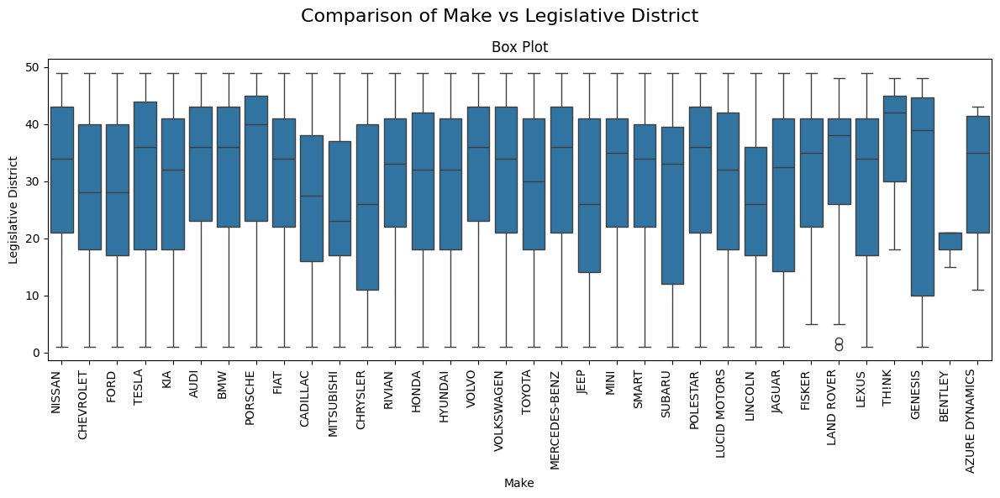

In [56]:
cat_col = 'Make'
num_col = 'Legislative District'

def plot_cat_num(df, cat_col, num_col):
    fig, ax = plt.subplots(figsize = (12, 6))
    fig.suptitle(f'Comparison of {cat_col} vs {num_col}', fontsize = 16)
    
    sns.boxplot(data = df, x = cat_col, y = num_col, ax = ax)
    ax.set_title('Box Plot')

    ax.set_xticks(range(len(df[cat_col].unique())))
    ax.set_xticklabels(df[cat_col].unique(), rotation = 90, ha = 'right')
    
    plt.tight_layout()
    plt.show()
    
print(f"Observation for {cat_col} vs {num_col}:")
print("Box Plot: Shows median, quartiles, and potential outliers.")
print("\n")


plot_cat_num(data, 'Make','Legislative District')

Observation for Electric Vehicle Type vs Electric Range:
Box Plot: Shows median, quartiles, and potential outliers.




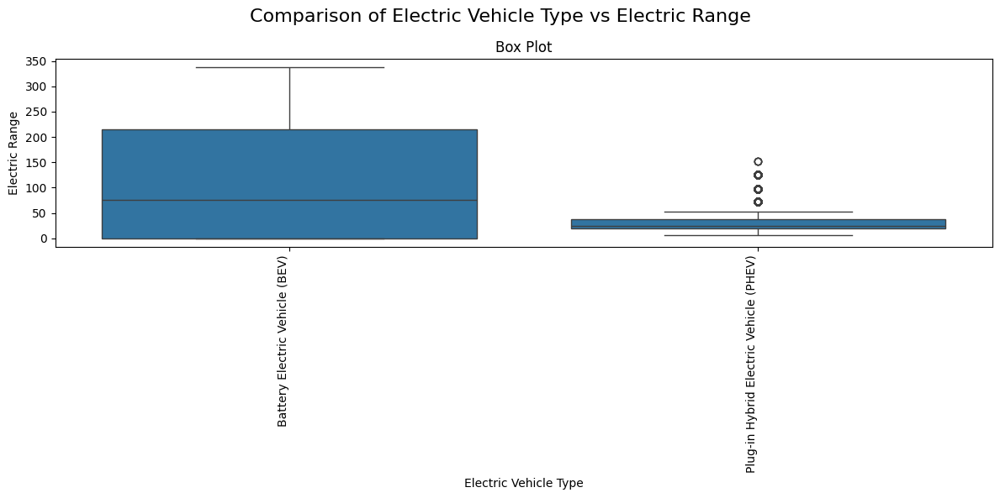

In [57]:
cat_col = 'Electric Vehicle Type'
num_col = 'Electric Range'

def plot_cat_num(df, cat_col, num_col):
    fig, ax = plt.subplots(figsize = (12, 6))
    fig.suptitle(f'Comparison of {cat_col} vs {num_col}', fontsize = 16)
    
    sns.boxplot(data = df, x = cat_col, y = num_col, ax = ax)
    ax.set_title('Box Plot')

    ax.set_xticks(range(len(df[cat_col].unique())))
    ax.set_xticklabels(df[cat_col].unique(), rotation = 90, ha = 'right')
    
    plt.tight_layout()
    plt.show()
    
print(f"Observation for {cat_col} vs {num_col}:")
print("Box Plot: Shows median, quartiles, and potential outliers.")
print("\n")


plot_cat_num(data, 'Electric Vehicle Type','Electric Range')

## Observation

There are weak correlation between electric range, price, and model year.

Different vehicle make show variations in range, price, and where they are sold.

Electric vehicle types differ by country and manufacturer.

Electric range varies across different types of electric vehicles.
Many factors affect the characteristics and adoption of electric vehicles.

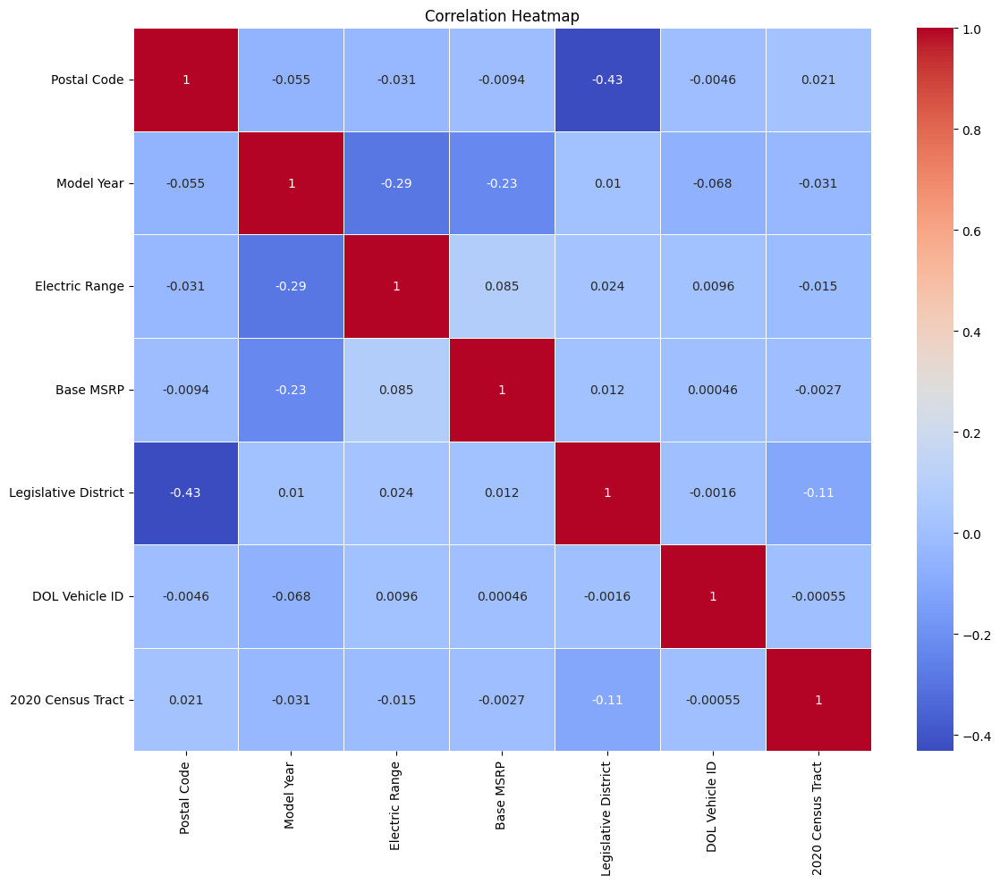

In [58]:
plt.figure(figsize = (12, 10))
correlation_matrix = data[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm', linewidth = 0.5)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

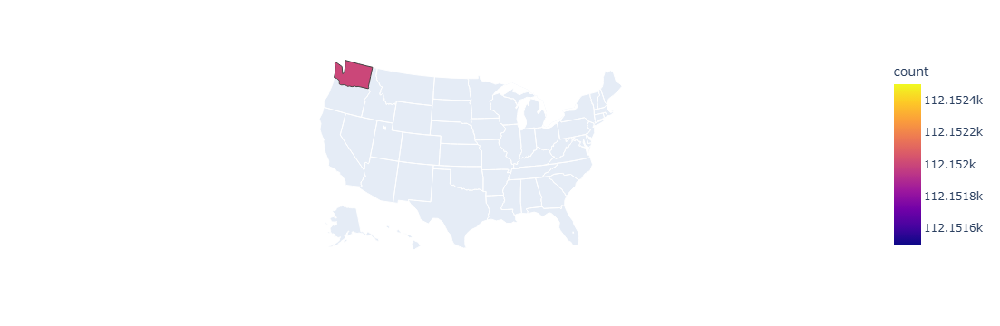

In [63]:
temp = data.groupby('State').size().reset_index(name = 'count')
fig = px.choropleth(temp,
                    locations = 'State', color = 'count', 
                     hover_name = 'count', locationmode = "USA-states", scope = "usa",)
fig.show()
                     

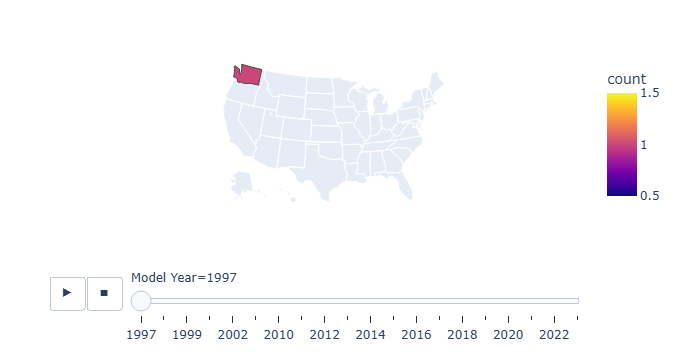

In [64]:
temp1 = data.groupby(['State', 'Model Year']).size().reset_index(name = 'count')
fig = px.choropleth(temp1,
                    locations = 'State', color = 'count', 
                    hover_name = 'count', locationmode = "USA-states", 
                    scope = "usa", animation_frame = 'Model Year'
                   )
fig.show()

In [65]:
final = data.groupby(['Model Year', 'Make']).size().reset_index(name = 'count')
final.head()

,Model Year,Make,count
0,1997,CHEVROLET,1
1,1998,FORD,1
2,1999,FORD,3
3,2000,FORD,10
4,2002,TOYOTA,2


In [74]:
bcr.bar_chart_race(
    df = final.pivot_table(index = 'Model Year', columns = 'Make', values = 'count', fill_value = 0),
    filename = "final.gif",
    orientation = "h",
    sort = 'desc',
    n_bars = 10,
    steps_per_period = 45,
    period_length = 3000,
    title = 'Year-wise Sales of Each Electric Vehicle maker',
    period_label = {'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 50, 'weight': 'semibold'},
    filter_column_colors = True,
    bar_kwargs = {'alpha': .99, 'lw': 0}
)


C:\Users\shahe\AppData\Roaming\Python\Python312\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\shahe\AppData\Roaming\Python\Python312\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahe\AppData\Roaming\Python\Python312\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

MovieWriter imagemagick unavailable; using Pillow instead.


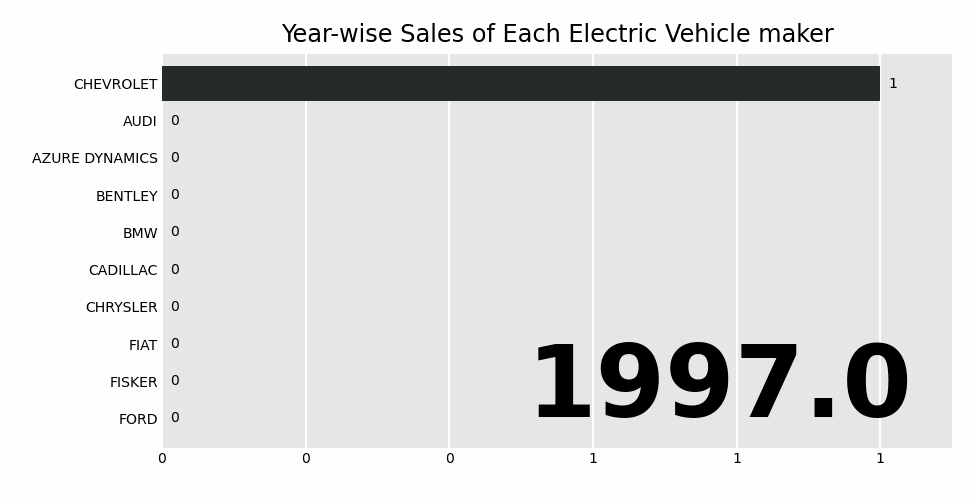

In [75]:
from IPython.display import Image
Image(filename = 'final.gif')